## SPH6004 Assignment 1
Idauli Tamarin
<br> March 2025

In [1]:
import pandas as pd
import numpy as np

import torch
import torch.nn as nn
from torch.optim import SGD

import plotly.graph_objects as go
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, average_precision_score

### Pre-process Dataset

In [2]:
#Load the dataset 
mimic_pd = pd.read_csv('C:/Users/idaul/Dropbox/1 Idauli/1 NUS PhD/0 2025 Sem 5/1 SPH6004 Advanced Statistical Learning/Assignments/Assignment 1/sph6004_assignment1_data.csv')
mimic_pd.head()

,id,hospital_mortality,aki_stage,gender,admission_age,race,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,...,ggt_max,ld_ldh_min,ld_ldh_max,gcs_min,gcs_motor,gcs_verbal,gcs_eyes,gcs_unable,height,weight_admit
0,39553978,0,0,F,52.559969,WHITE,91.0,105.0,96.500000,82.0,...,NaN,173.0,173.0,14.0,6.0,4.0,4.0,0.0,152.0,39.4
1,39765666,0,0,F,76.486231,BLACK/AFRICAN AMERICAN,68.0,80.0,73.636364,130.0,...,NaN,NaN,NaN,15.0,6.0,5.0,4.0,0.0,NaN,76.2
2,37067082,0,0,F,55.881486,WHITE,78.0,106.0,93.200000,117.0,...,NaN,NaN,NaN,15.0,6.0,5.0,4.0,0.0,NaN,71.2
3,31205490,0,0,F,46.275517,WHITE,55.0,91.0,79.480000,73.0,...,NaN,NaN,NaN,15.0,6.0,5.0,4.0,0.0,157.0,72.2
4,37510196,1,2,F,77.018296,BLACK/AFRICAN AMERICAN,38.0,80.0,71.392857,93.0,...,NaN,NaN,NaN,15.0,1.0,0.0,1.0,1.0,157.0,65.0


In [3]:
#Check the dataset
mimic_pd.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Data columns (total 165 columns):
 #    Column                  Non-Null Count  Dtype  
---   ------                  --------------  -----  
 0    id                      50920 non-null  int64  
 1    hospital_mortality      50920 non-null  int64  
 2    aki_stage               50920 non-null  int64  
 3    gender                  50920 non-null  object 
 4    admission_age           50920 non-null  float64
 5    race                    50920 non-null  object 
 6    heart_rate_min          50841 non-null  float64
 7    heart_rate_max          50841 non-null  float64
 8    heart_rate_mean         50841 non-null  float64
 9    sbp_min                 50823 non-null  float64
 10   sbp_max                 50823 non-null  float64
 11   sbp_mean                50823 non-null  float64
 12   dbp_min                 50823 non-null  float64
 13   dbp_max                 50823 non-null  float64
 14   dbp_mean            

#### Create new variables based on existing variables: 
- aki_binary = 0 if aki_stage = 0; aki_binary = 1 if aki_stage > 0
- bmi = weight/((height/100)^2); weight in kg, height in cm
- female = 1 if gender = 'F'
- race_cat is race consolidated to: other, white, black, hispanic, asian (including native american) 

In [4]:
mimic_pd['aki_binary'] = 0
mimic_pd.loc[mimic_pd['aki_stage'] > 0, 'aki_binary'] = 1 

mimic_pd["bmi"] = np.nan
mimic_pd.loc[(mimic_pd['weight_admit'].isnull()==False) & (mimic_pd['height'].isnull()==False) & (mimic_pd['height']!=0), 'bmi'] = (mimic_pd['weight_admit'])/((mimic_pd['height']/100)**2)

mimic_pd['female'] = 1
mimic_pd.loc[mimic_pd['gender']=='M', 'female']=0

#mimic_pd[['id','aki_stage','aki_binary', 'weight_admit', 'height', 'bmi']]
#pd.crosstab(mimic_pd["female"], mimic_pd["gender"])

In [5]:
#mimic_pd["race"].unique()

mimic_pd['race_cat'] = 'other'
mimic_pd.loc[mimic_pd["race"].str.contains("WHITE"), 'race_cat'] = 'white'
mimic_pd.loc[mimic_pd["race"].str.contains("BLACK"), 'race_cat'] = 'black'
mimic_pd.loc[(mimic_pd["race"].str.contains("HISPANIC")) | (mimic_pd["race"].str.contains("SOUTH AMERICAN")) , 'race_cat'] = 'hispanic'
mimic_pd.loc[(mimic_pd["race"].str.contains("ASIAN")) | (mimic_pd["race"].str.contains("NATIVE")), 'race_cat'] = 'asian'

pd.crosstab(mimic_pd["race"], mimic_pd["race_cat"])

race_cat,asian,black,hispanic,other,white
race,,,,,
AMERICAN INDIAN/ALASKA NATIVE,87,0,0,0,0
ASIAN,614,0,0,0,0
ASIAN - ASIAN INDIAN,121,0,0,0,0
ASIAN - CHINESE,547,0,0,0,0
ASIAN - KOREAN,46,0,0,0,0
ASIAN - SOUTH EAST ASIAN,168,0,0,0,0
BLACK/AFRICAN,0,194,0,0,0
BLACK/AFRICAN AMERICAN,0,3845,0,0,0
BLACK/CAPE VERDEAN,0,319,0,0,0


In [6]:
#Process the categorical data 'race_cat'
temp_race = pd.get_dummies(mimic_pd['race_cat'], dtype=float, prefix='race')
temp_race

,race_asian,race_black,race_hispanic,race_other,race_white
0,0.0,0.0,0.0,0.0,1.0
1,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0
3,0.0,0.0,0.0,0.0,1.0
4,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...
50915,0.0,0.0,0.0,0.0,1.0
50916,0.0,0.0,0.0,0.0,1.0
50917,0.0,0.0,0.0,0.0,1.0
50918,0.0,0.0,0.0,0.0,1.0


In [7]:
#Insert back race to main dataset
mimic_pd = pd.concat([mimic_pd, temp_race], axis=1)

In [8]:
#Check the dataset
mimic_pd.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50920 entries, 0 to 50919
Data columns (total 174 columns):
 #    Column                  Non-Null Count  Dtype  
---   ------                  --------------  -----  
 0    id                      50920 non-null  int64  
 1    hospital_mortality      50920 non-null  int64  
 2    aki_stage               50920 non-null  int64  
 3    gender                  50920 non-null  object 
 4    admission_age           50920 non-null  float64
 5    race                    50920 non-null  object 
 6    heart_rate_min          50841 non-null  float64
 7    heart_rate_max          50841 non-null  float64
 8    heart_rate_mean         50841 non-null  float64
 9    sbp_min                 50823 non-null  float64
 10   sbp_max                 50823 non-null  float64
 11   sbp_mean                50823 non-null  float64
 12   dbp_min                 50823 non-null  float64
 13   dbp_max                 50823 non-null  float64
 14   dbp_mean            

In [9]:
#Check correlation between sample of two similar variables
temp = mimic_pd.loc[(mimic_pd['calcium_bg_max'].isnull()==False) & (mimic_pd['calcium_lab_max'].isnull()==False), ['calcium_bg_max','calcium_lab_max']]
#temp
temp.corr()

,calcium_bg_max,calcium_lab_max
calcium_bg_max,1.000000,0.155345
calcium_lab_max,0.155345,1.000000


#### Is the dataset imbalanced?

In [10]:
mimic_pd['aki_binary'].value_counts(normalize=True)

aki_binary
1    0.668892
0    0.331108
Name: proportion, dtype: float64

In [12]:
mimic_pd['aki_stage'].value_counts(normalize=True)

aki_stage
0    0.331108
2    0.319874
1    0.193205
3    0.155813
Name: proportion, dtype: float64

#### Drop variables:
- hospital mortality (not related)
- data available for only < 20,000 observations

In [13]:
data_notnull = mimic_pd.notnull().sum()
keep_columns = data_notnull[data_notnull > 20000].index

mimicbin1_pd = mimic_pd[keep_columns]

#Drop hospital mortality, aki_stage (for binary prediction we use aki_binary), gender (use female instead), race and race_cat (use binaries for race)
mimicbin1_pd = mimicbin1_pd.drop(['id','hospital_mortality', 'aki_stage', 'gender', 'race', 'race_cat'], axis=1)

#Check the dataset
#mimicbin1_pd.info(verbose=True, show_counts=True)

#### Split the dataset to training and test

In [14]:
#Split predictors (X) from outcome (y)
X = mimicbin1_pd.drop('aki_binary', axis=1)  
y = mimicbin1_pd['aki_binary']  

#Check
#print(y)
#X

In [15]:
#Split into training and test datasets, set seed for consistency
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=15)

#### Handle Missing Values

Check two ways to handle missing values:
- impute missing values
- drop the rows with missing values (which only leaves less than 1,500 observations for each training and testing dataset, so perhaps better to impute)

In [16]:
#Impute missing values with the mean of the column
X_train_imputed = X_train.fillna(X_train.mean())
X_test_imputed = X_test.fillna(X_test.mean())

#Check
#X_train_imputed.describe()

In [17]:
#Check 
#X_test_imputed.describe()

In [18]:
#Drop missing values
X_train_drop = X_train.dropna()
X_test_drop = X_test.dropna()

#Check
#X_train_drop.describe()

In [20]:
#Check
#X_test_drop.describe()
print("Observations for training set: ", len(X_train_drop))
print("Observations for test set: ", len(X_test_drop))

Observations for training set:  1710
Observations for test set:  1168


In [21]:
#Check correlation
#round(X_train_imputed.apply(X_train_imputed.corrwith),2)

#### Normalize

In [22]:
#Normalize the non-categorical predictors for the training data
X_train_con = X_train_imputed.drop(['female', 'race_other', 'race_white', 'race_black', 'race_hispanic', 'race_asian'], axis=1)
X_train_con = (X_train_con-X_train_con.mean())/X_train_con.std()

#Concat the processed categorical and non-categorical data
X_train_norm = pd.concat([X_train_con, X_train_imputed['female'], X_train_imputed['race_other'], X_train_imputed['race_white'], 
                          X_train_imputed['race_black'], X_train_imputed['race_hispanic'], X_train_imputed['race_asian']], axis=1)

#Check
X_train_norm.describe()

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,gcs_unable,height,weight_admit,bmi,female,race_other,race_white,race_black,race_hispanic,race_asian
count,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,...,3.055200e+04,3.055200e+04,3.055200e+04,3.055200e+04,30552.000000,30552.000000,30552.000000,30552.000000,30552.000000,30552.000000
mean,6.935187e-16,-1.439598e-16,2.458247e-16,4.331585e-16,-1.986133e-16,2.600114e-16,-3.186186e-16,-5.424656e-16,2.916407e-16,-1.557045e-16,...,1.232612e-16,1.871477e-15,-3.651323e-17,-9.728333e-16,0.440462,0.167223,0.674784,0.088930,0.036168,0.032895
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.496451,0.373181,0.468463,0.284648,0.186711,0.178364
min,-2.715562e+00,-4.566070e+00,-3.233263e+00,-3.541097e+00,-5.317851e+00,-4.573588e+00,-5.038964e+00,-3.949302e+00,-3.638011e+00,-4.154453e+00,...,-5.104818e-01,-6.431977e+00,-3.104755e+00,-5.370488e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-6.065718e-01,-6.545665e-01,-7.053844e-01,-6.995133e-01,-5.857358e-01,-7.180928e-01,-7.110838e-01,-6.256727e-01,-6.838491e-01,-6.930012e-01,...,-5.104818e-01,3.832367e-15,-5.930001e-01,-1.781779e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.013784e-01,-5.789649e-02,-1.220278e-01,-9.486683e-02,-7.194637e-02,-1.012136e-01,-1.320536e-01,-2.912381e-02,-1.235770e-01,-1.059048e-01,...,-5.104818e-01,3.832367e-15,-9.527905e-02,-6.686398e-16,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,7.645826e-01,6.050702e-01,5.585548e-01,6.220234e-01,5.560185e-01,5.597283e-01,6.095217e-01,5.674251e-01,5.385627e-01,5.881399e-01,...,-5.104818e-01,4.031499e-02,4.342730e-01,-6.686398e-16,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,2.055045e+00,6.439177e+00,8.628321e+00,5.747132e+00,5.808089e+00,8.975723e+00,5.899867e+00,5.595480e+00,1.031786e+01,6.390105e+00,...,1.968081e+00,7.591323e+00,4.512403e+01,4.469846e+01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [23]:
X_train_norm.head()

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,gcs_unable,height,weight_admit,bmi,female,race_other,race_white,race_black,race_hispanic,race_asian
39851,-0.263301,1.201740,0.704394,0.782342,0.156404,-0.101214,0.727555,0.056097,-0.581981,-0.025239,...,-0.510482,3.832367e-15,-0.199453,-6.686398e-16,1,0.0,1.0,0.0,0.0,0.0
3247,-0.086313,0.671367,-0.365093,0.097888,-0.129034,-0.982470,-0.810387,-1.477885,-0.276379,-0.683905,...,-0.510482,3.141622e+00,1.266702,3.484670e-01,0,0.0,1.0,0.0,0.0,0.0
37825,1.560666,-1.516423,-0.559545,-1.765168,0.213492,1.000356,0.390239,-1.051779,-0.734783,-1.608627,...,-0.510482,-2.293639e-01,-0.430951,-7.388909e-01,1,1.0,0.0,0.0,0.0,0.0
48184,-1.031872,-0.654567,0.509942,0.081277,-0.642824,-0.497779,-0.691313,-1.307443,-0.683849,-1.151216,...,-0.510482,-9.035610e-01,-0.392368,-3.760486e-01,1,0.0,1.0,0.0,0.0,0.0
10798,-1.060508,0.339884,0.364103,0.251175,-0.186122,0.471603,-0.025925,1.163974,0.793232,1.639853,...,-0.510482,3.832367e-15,-1.291353,-6.686398e-16,1,0.0,1.0,0.0,0.0,0.0


In [24]:
#Normalize the non-categorical predictors for the test data
X_test_con = X_test_imputed.drop(['female', 'race_other', 'race_white', 'race_black', 'race_hispanic', 'race_asian'], axis=1)
X_test_con = (X_test_con-X_test_con.mean())/X_test_con.std()

#Concat the processed categorical and non-categorical data
X_test_norm = pd.concat([X_test_con, X_test_imputed['female'], X_test_imputed['race_other'], X_test_imputed['race_white'], 
                          X_test_imputed['race_black'], X_test_imputed['race_hispanic'], X_test_imputed['race_asian']], axis=1)

#Check
X_test_norm.describe()

,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,...,gcs_unable,height,weight_admit,bmi,female,race_other,race_white,race_black,race_hispanic,race_asian
count,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,...,2.036800e+04,2.036800e+04,2.036800e+04,2.036800e+04,20368.000000,20368.000000,20368.000000,20368.000000,20368.000000,20368.000000
mean,-5.313023e-16,1.534951e-17,-5.086269e-16,3.851331e-16,-5.888630e-16,-5.253718e-16,-9.056210e-16,1.712866e-16,1.953574e-16,5.002545e-16,...,-8.372460e-18,-4.130413e-16,3.997849e-16,-1.287615e-15,0.442999,0.172918,0.667125,0.094413,0.033189,0.032355
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.496752,0.378186,0.471254,0.292409,0.179135,0.176945
min,-2.717905e+00,-4.470360e+00,-3.125591e+00,-3.234307e+00,-5.195441e+00,-5.017909e+00,-5.340699e+00,-3.949581e+00,-3.467143e+00,-3.931494e+00,...,-5.092024e-01,-6.258361e+00,-1.717688e+00,-5.432924e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-6.003747e-01,-6.544636e-01,-7.126570e-01,-7.051795e-01,-5.828472e-01,-6.656380e-01,-7.073959e-01,-6.248693e-01,-6.743191e-01,-6.983619e-01,...,-5.092024e-01,0.000000e+00,-3.331444e-01,-2.094362e-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.041483e-01,-6.234173e-02,-1.217344e-01,-9.075250e-02,-7.033681e-02,-9.412764e-02,-1.273363e-01,-2.812622e-02,-1.157543e-01,-1.115263e-01,...,-5.092024e-01,0.000000e+00,-5.623566e-02,-1.355619e-15,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,7.645891e-01,5.955714e-01,5.676754e-01,6.230709e-01,5.560648e-01,5.653073e-01,6.086679e-01,5.686169e-01,4.935891e-01,6.045356e-01,...,-5.092024e-01,6.304718e-02,2.398437e-01,-1.355619e-15,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,2.200894e+00,4.937798e+00,5.885979e+00,5.079564e+00,5.168659e+00,9.181924e+00,5.298336e+00,5.427810e+00,1.019231e+01,5.325008e+00,...,1.972670e+00,7.438023e+00,1.231682e+02,3.025993e+01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Convert to tensors

In [25]:
#Convert training set
X_train_tens = torch.tensor(X_train_norm.to_numpy(), dtype=torch.float32)
m_tr,n_tr = X_train_tens.shape
y_train_tens = torch.tensor(y_train.to_numpy(),dtype=torch.float32).reshape(m_tr,1)

#Convert test set
X_test_tens = torch.tensor(X_test_norm.to_numpy(), dtype=torch.float32)
m_te,n_te = X_test_tens.shape
y_test_tens = torch.tensor(y_test.to_numpy(),dtype=torch.float32).reshape(m_te,1)

In [26]:
#Check
print('Training input has size: ',X_train_tens.shape)
print('Training output has size: ',y_train_tens.shape)
print('Test input has size: ',X_test_tens.shape)
print('Test output has size: ',y_test_tens.shape)

X_train_tens

Training input has size:  torch.Size([30552, 107])
Training output has size:  torch.Size([30552, 1])
Test input has size:  torch.Size([20368, 107])
Test output has size:  torch.Size([20368, 1])


tensor([[-0.2633,  1.2017,  0.7044,  ...,  0.0000,  0.0000,  0.0000],
        [-0.0863,  0.6714, -0.3651,  ...,  0.0000,  0.0000,  0.0000],
        [ 1.5607, -1.5164, -0.5595,  ...,  0.0000,  0.0000,  0.0000],
        ...,
        [ 0.8956, -1.3175, -1.8721,  ...,  0.0000,  0.0000,  0.0000],
        [-0.7131, -0.7209, -0.6568,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.5362,  0.2736, -0.1220,  ...,  0.0000,  0.0000,  1.0000]])

#### Linear Regression with Stochastic Gradient Descent (SGD)

In [27]:
# Linear regression is a linear model.
h = torch.nn.Linear(
    in_features=107,
    out_features=1,
    bias=True
)

# parameters of our model 'h' are randomly initialized
print(h.weight)
print(h.bias)

Parameter containing:
tensor([[-0.0063, -0.0922,  0.0927,  0.0267,  0.0786,  0.0775, -0.0683, -0.0966,
         -0.0707,  0.0720,  0.0097,  0.0298, -0.0057, -0.0293, -0.0417, -0.0246,
          0.0578,  0.0888,  0.0883,  0.0630,  0.0770, -0.0880,  0.0785,  0.0367,
          0.0284, -0.0889,  0.0795, -0.0650,  0.0197,  0.0101,  0.0346, -0.0527,
         -0.0893,  0.0651,  0.0440,  0.0890, -0.0722, -0.0617, -0.0765,  0.0763,
          0.0547, -0.0332,  0.0868, -0.0486, -0.0104,  0.0624, -0.0486,  0.0814,
          0.0657,  0.0297, -0.0037, -0.0856, -0.0707, -0.0497,  0.0917,  0.0859,
         -0.0589, -0.0645,  0.0040,  0.0362,  0.0275,  0.0029, -0.0467,  0.0348,
          0.0861,  0.0411, -0.0951,  0.0502,  0.0201,  0.0191, -0.0045, -0.0439,
         -0.0074,  0.0036,  0.0134, -0.0939,  0.0220, -0.0439, -0.0427,  0.0021,
         -0.0947, -0.0227, -0.0858, -0.0108,  0.0151,  0.0699,  0.0504,  0.0633,
         -0.0497, -0.0343,  0.0433,  0.0106,  0.0316,  0.0273, -0.0393,  0.0839,
      

In [28]:
h = torch.nn.Linear(
    in_features=n_tr,
    out_features=1,
    bias=True
)

# Use 0.001 learning rate to begin with
GD_optimizer = torch.optim.SGD(lr=0.001, params=h.parameters())
J_MSE = torch.nn.MSELoss()

# Apply gradient descent 10000 times
nIter = 4000
printInterval = 500

# PyTorch optimization steps:
# 1. Clear gradient
# 2. Calculate model and loss values (so-called forward path)
# 3. Calculate gradient of loss (so-called backward path)
# 4. Ask optimizer to update parameters of model
for i in range(nIter):
    # Step 1
    GD_optimizer.zero_grad()
    # Step 2
    pred = h(X_train_tens)
    loss = J_MSE(pred,y_train_tens)
    # Step 3
    loss.backward()
    # Step 4
    GD_optimizer.step()
    # Print loss value to track optimization progress
    if i == 0 or ((i+1) % printInterval) == 0:
        # We take square root of MSE (PyTorch internally averaged in J_MSE)
        # so that scale of printout is same as scale of y values.
        print('Iter {} : average rooted training MSE {:.3f}'.format(i+1,torch.sqrt(loss).item()))

Iter 1 : average rooted training MSE 1.073
Iter 500 : average rooted training MSE 0.500
Iter 1000 : average rooted training MSE 0.456
Iter 1500 : average rooted training MSE 0.446
Iter 2000 : average rooted training MSE 0.440
Iter 2500 : average rooted training MSE 0.437
Iter 3000 : average rooted training MSE 0.435
Iter 3500 : average rooted training MSE 0.433
Iter 4000 : average rooted training MSE 0.432


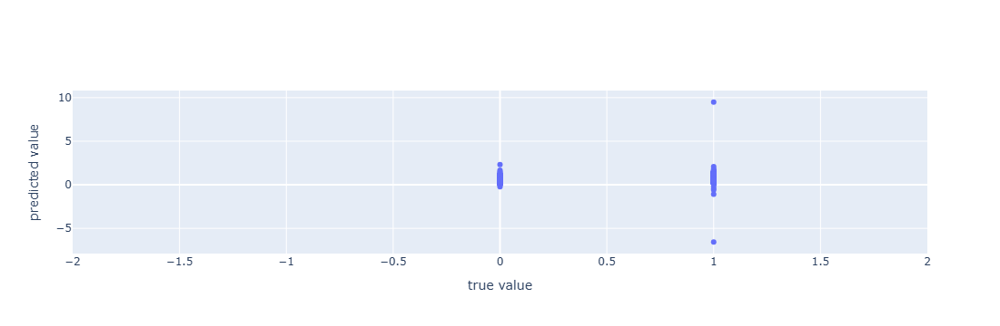

In [29]:
# Calculate testing results.
# In testing, no need to calculate gradient, so we use torch.no_grad() to disable it.
with torch.no_grad():
    test_pred = h(X_test_tens)

fig = go.Figure(
    data=go.Scatter(
        x=y_test_tens.squeeze(),
        y=test_pred.squeeze(),
        mode='markers'
    )
)
fig.update_xaxes(
    title='true value', range=[-2,2]
  )
fig.update_yaxes(
    title='predicted value'
    #range=[-2,2],
    #scaleanchor='x',
    #scaleratio=1
  )

In [30]:
#Calculate the MSE
from sklearn.metrics import mean_squared_error

mean_squared_error(y_test_tens, test_pred)

0.19475868969133417

### LOGISTIC REGRESSION

#### Logistic Regression with SGD

In [31]:
h = torch.nn.Linear(
    in_features=n_tr,
    out_features=1,
    bias=True
)
sigma = torch.nn.Sigmoid()

# Logistic model is linear+sigmoid
f = torch.nn.Sequential(
    h,
    sigma
)

J_BCE = torch.nn.BCELoss()
GD_optimizer = torch.optim.SGD(lr=0.005,params=f.parameters())

nIter = 10000
printInterval = 1000

for i in range(nIter):
    GD_optimizer.zero_grad()
    pred = f(X_train_tens)
    loss = J_BCE(pred,y_train_tens)
    loss.backward()
    GD_optimizer.step()
    if i == 0 or ((i+1)%printInterval) == 0:
        print('Iter {}: average BCE loss is {:.3f}'.format(i+1,loss.item()))

Iter 1: average BCE loss is 0.764
Iter 1000: average BCE loss is 0.555
Iter 2000: average BCE loss is 0.543
Iter 3000: average BCE loss is 0.539
Iter 4000: average BCE loss is 0.537
Iter 5000: average BCE loss is 0.536
Iter 6000: average BCE loss is 0.535
Iter 7000: average BCE loss is 0.534
Iter 8000: average BCE loss is 0.534
Iter 9000: average BCE loss is 0.534
Iter 10000: average BCE loss is 0.533


In [32]:
#Evaluate on test data
with torch.no_grad():
    pred_test = f(X_test_tens)

In [33]:
# Show AUROC and average precision
auroc = roc_auc_score(y_test_tens,pred_test)
ap = average_precision_score(y_test_tens,pred_test)
print('On test dataset: AUROC {:.3f}, AP {:.3f}'.format(auroc,ap))

On test dataset: AUROC 0.758, AP 0.853


In [34]:
threshold = 0.5

# The output has shape M*1. Use .squeeze to remove the trailing dimension with size 1.
binary_pred = np.where(pred_test.squeeze()>threshold,'AKI','no AKI')
label = np.where(y_test_tens.squeeze()>0.5,'AKI','no AKI')
acc = (binary_pred==label).sum()/binary_pred.shape[0]
print('Accuracy on test dataset is {:.2f}%'.format(acc*100))

Accuracy on test dataset is 73.46%


In [35]:
pd.crosstab(
    index=label,
    columns=binary_pred,
    rownames=['Label'],
    colnames=['Pred'], 
    normalize=True
)

Pred,AKI,no AKI
Label,,
AKI,0.598242,0.072418
no AKI,0.192999,0.136341


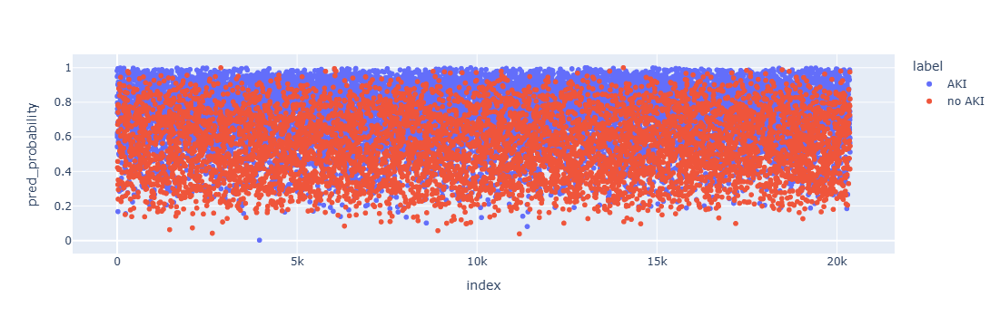

In [36]:
# Use plotly express (px) to visualize test results.
# px expects DataFrame input
pred_df = pd.DataFrame(
    {
        'pred_probability':pred_test.squeeze(),
        'label':label
    }
)
fig = px.scatter(data_frame=pred_df,y='pred_probability',color='label')
fig

#### Which features are important?

In [37]:
#Get the feature names
feature_names = list(X_test_norm)

# Get feature importances
weights = f[0].weight.detach().numpy()
feature_importances = np.abs(weights).flatten()
feature_indices = np.argsort(feature_importances)[::-1]

# Print feature importances
for i in feature_indices:
    print(f"Feature: {feature_names[i]}, Importance: {feature_importances[i]:.4f}")

Feature: weight_admit, Importance: 0.5866
Feature: admission_age, Importance: 0.3855
Feature: race_white, Importance: 0.2886
Feature: creatinine_max, Importance: 0.2110
Feature: race_other, Importance: 0.2057
Feature: hemoglobin_lab_min, Importance: 0.1959
Feature: gcs_verbal, Importance: 0.1780
Feature: temperature_vital_max, Importance: 0.1774
Feature: chloride_lab_max, Importance: 0.1737
Feature: race_black, Importance: 0.1609
Feature: sbp_min, Importance: 0.1568
Feature: hematocrit_lab_max, Importance: 0.1509
Feature: sbp_max, Importance: 0.1457
Feature: ptt_max, Importance: 0.1453
Feature: bicarbonate_lab_min, Importance: 0.1449
Feature: lactate_min, Importance: 0.1331
Feature: temperature_vital_min, Importance: 0.1329
Feature: creatinine_min, Importance: 0.1243
Feature: calcium_lab_min, Importance: 0.1194
Feature: bilirubin_total_max, Importance: 0.1162
Feature: bicarbonate_lab_max, Importance: 0.1079
Feature: sbp_mean, Importance: 0.1039
Feature: gcs_unable, Importance: 0.1028
F

#### Logistic Regression with Adam Optimizer

In [38]:
h = torch.nn.Linear(
    in_features=n_tr,
    out_features=1,
    bias=True
)
sigma = torch.nn.Sigmoid()

# Logistic model is linear+sigmoid
f = torch.nn.Sequential(
    h,
    sigma
)

J_BCE = torch.nn.BCELoss()
# Use the Adam optimizer, which is a variant of gradient descent method with momentum.
GD_optimizer = torch.optim.Adam(lr=0.001,params=f.parameters())

nIter = 1000
printInterval = 200

for i in range(nIter):
    GD_optimizer.zero_grad()
    pred = f(X_train_tens)
    loss = J_BCE(pred,y_train_tens)
    loss.backward()
    GD_optimizer.step()
    if i == 0 or ((i+1)%printInterval) == 0:
        print('Iter {}: average BCE loss is {:.3f}'.format(i+1,loss.item()))

Iter 1: average BCE loss is 0.712
Iter 200: average BCE loss is 0.562
Iter 400: average BCE loss is 0.541
Iter 600: average BCE loss is 0.535
Iter 800: average BCE loss is 0.533
Iter 1000: average BCE loss is 0.532


In [39]:
#Evaluate on test dataset
with torch.no_grad():
    pred_test = f(X_test_tens)

In [40]:
#Show AUROC and average precision
auroc = roc_auc_score(y_test_tens,pred_test)
ap = average_precision_score(y_test_tens,pred_test)
print('On test dataset: AUROC {:.3f}, AP {:.3f}'.format(auroc,ap))

On test dataset: AUROC 0.758, AP 0.853


In [41]:
threshold = 0.5

# The output has shape M*1. Use .squeeze to remove the trailing dimension with size 1.
binary_pred = np.where(pred_test.squeeze()>threshold,'AKI','no AKI')
label = np.where(y_test_tens.squeeze()>0.5,'AKI','no AKI')
acc = (binary_pred==label).sum()/binary_pred.shape[0]
print('Accuracy on test dataset is {:.2f}%'.format(acc*100))

Accuracy on test dataset is 73.12%


In [42]:
pd.crosstab(
    index=label,
    columns=binary_pred,
    rownames=['Label'],
    colnames=['Pred'], 
    normalize=True
)

Pred,AKI,no AKI
Label,,
AKI,0.592694,0.077965
no AKI,0.190839,0.138502


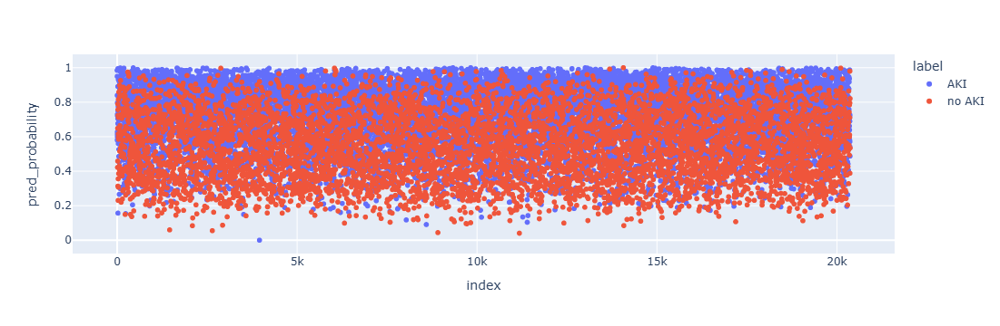

In [43]:
# Use plotly express (px) to visualize test results.
# px expects DataFrame input
pred_df = pd.DataFrame(
    {
        'pred_probability':pred_test.squeeze(),
        'label':label
    }
)
fig = px.scatter(data_frame=pred_df,y='pred_probability',color='label')
fig

In [44]:
# Save the model parameters for later comparisons.
weight = h.weight.detach().squeeze().clone()

#### Logistic Regression with L2 Regularization

In [45]:
h_L2 = torch.nn.Linear(
    in_features=n_tr,
    out_features=1,
    bias=True
)
sigma = torch.nn.Sigmoid()

# Logistic model is linear+sigmoid
f_L2 = torch.nn.Sequential(
    h_L2,
    sigma
)

J_BCE = torch.nn.BCELoss()

# PyTorch optimizer support L2 regularization by
# setting the weight_decay parameter, which corresponds to
# the regularization strength.
GD_optimizer = torch.optim.Adam(lr=0.001,params=f_L2.parameters(),weight_decay=0.01)

nIter = 1000
printInterval = 100

for i in range(nIter):
    GD_optimizer.zero_grad()
    pred = f_L2(X_train_tens)
    loss = J_BCE(pred,y_train_tens)
    loss.backward()
    GD_optimizer.step()
    if i == 0 or ((i+1)%printInterval) == 0:
        print('Iter {}: average BCE loss is {:.3f}'.format(i+1,loss.item()))

Iter 1: average BCE loss is 0.715
Iter 100: average BCE loss is 0.599
Iter 200: average BCE loss is 0.569
Iter 300: average BCE loss is 0.554
Iter 400: average BCE loss is 0.546
Iter 500: average BCE loss is 0.542
Iter 600: average BCE loss is 0.539
Iter 700: average BCE loss is 0.538
Iter 800: average BCE loss is 0.536
Iter 900: average BCE loss is 0.536
Iter 1000: average BCE loss is 0.535


In [46]:
#Evaluate with test data
with torch.no_grad():
    pred_test = f_L2(X_test_tens)

In [47]:
#Show AUROC and average precision
auroc = roc_auc_score(y_test_tens,pred_test)
ap = average_precision_score(y_test_tens,pred_test)
print('On test dataset: AUROC {:.3f}, AP {:.3f}'.format(auroc,ap))

On test dataset: AUROC 0.757, AP 0.853


In [48]:
threshold = 0.5

# The output has shape M*1. Use .squeeze to remove the trailing dimension with size 1.
binary_pred = np.where(pred_test.squeeze()>threshold,'AKI','no AKI')
label = np.where(y_test_tens.squeeze()>0.5,'AKI','no AKI')
acc = (binary_pred==label).sum()/binary_pred.shape[0]
print('Accuracy on test dataset is {:.2f}%'.format(acc*100))

Accuracy on test dataset is 73.34%


In [49]:
pd.crosstab(
    index=label,
    columns=binary_pred,
    rownames=['Label'],
    colnames=['Pred'], 
    normalize=True
)

Pred,AKI,no AKI
Label,,
AKI,0.593431,0.077229
no AKI,0.189415,0.139925


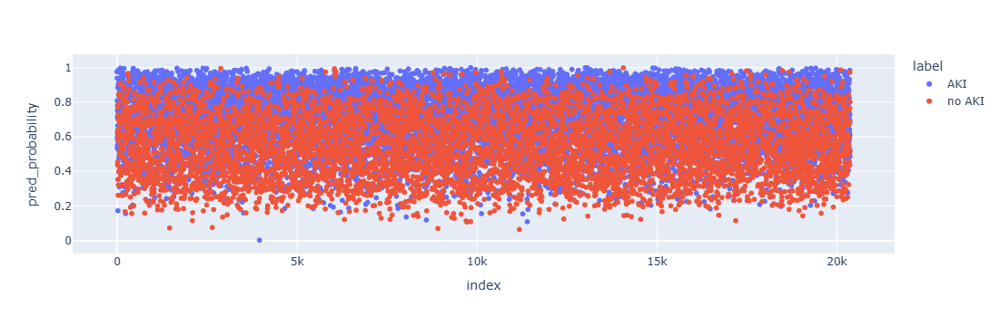

In [50]:
# Use plotly express (px) to visualize test results.
# px expects DataFrame input
pred_df = pd.DataFrame(
    {
        'pred_probability':pred_test.squeeze(),
        'label':label
    }
)
fig = px.scatter(data_frame=pred_df,y='pred_probability',color='label')
fig

In [51]:
weight_L2 = h_L2.weight.detach().squeeze().clone()

#### Logistic Regression with L1 Regularization

In [52]:
h_L1 = torch.nn.Linear(
    in_features=n_tr,
    out_features=1,
    bias=True
)
sigma = torch.nn.Sigmoid()

# Logistic model is linear+sigmoid
f_L1 = torch.nn.Sequential(
    h_L1,
    sigma
)

J_BCE = torch.nn.BCELoss()

GD_optimizer = torch.optim.Adam(lr=0.001,params=f_L1.parameters())

# Define L_1 regularization
def L1_reg(model,lbd):
    result = torch.tensor(0)
    for param in model.parameters(): # iterate over all parameters of our model
        result = result + param.abs().sum()

    return lbd*result


nIter = 1000
printInterval = 100
lbd = 0.001 # L1 reg strength

for i in range(nIter):
    GD_optimizer.zero_grad()
    pred = f_L1(X_train_tens)
    loss = J_BCE(pred,y_train_tens)
    (loss+L1_reg(f_L1,lbd)).backward()
    GD_optimizer.step()
    if i == 0 or ((i+1)%printInterval) == 0:
        print('Iter {}: average BCE loss is {:.3f}'.format(i+1,loss.item()))

Iter 1: average BCE loss is 0.679
Iter 100: average BCE loss is 0.580
Iter 200: average BCE loss is 0.557
Iter 300: average BCE loss is 0.547
Iter 400: average BCE loss is 0.541
Iter 500: average BCE loss is 0.538
Iter 600: average BCE loss is 0.536
Iter 700: average BCE loss is 0.535
Iter 800: average BCE loss is 0.534
Iter 900: average BCE loss is 0.534
Iter 1000: average BCE loss is 0.534


In [53]:
#Evaluate with test data
with torch.no_grad():
    pred_test = f_L1(X_test_tens)

In [54]:
#Calculate AUROC and average precision
auroc = roc_auc_score(y_test_tens,pred_test)
ap = average_precision_score(y_test_tens,pred_test)
print('On test dataset: AUROC {:.3f}, AP {:.3f}'.format(auroc,ap))

On test dataset: AUROC 0.758, AP 0.853


In [55]:
threshold = 0.5

# The output has shape M*1. Use .squeeze to remove the trailing dimension with size 1.
binary_pred = np.where(pred_test.squeeze()>threshold,'AKI','no AKI')
label = np.where(y_test_tens.squeeze()>0.5,'AKI','no AKI')
acc = (binary_pred==label).sum()/binary_pred.shape[0]
print('Accuracy on test dataset is {:.2f}%'.format(acc*100))

Accuracy on test dataset is 73.34%


In [56]:
pd.crosstab(
    index=label,
    columns=binary_pred,
    rownames=['Label'],
    colnames=['Pred'], 
    normalize=True
)

Pred,AKI,no AKI
Label,,
AKI,0.596769,0.073890
no AKI,0.192704,0.136636


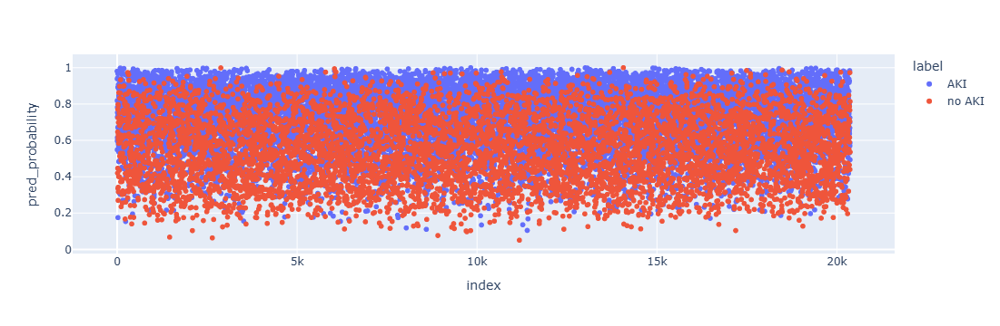

In [57]:
# Use plotly express (px) to visualize test results.
# px expects DataFrame input
pred_df = pd.DataFrame(
    {
        'pred_probability':pred_test.squeeze(),
        'label':label
    }
)
fig = px.scatter(data_frame=pred_df,y='pred_probability',color='label')
fig

In [58]:
weight_L1 = h_L1.weight.detach().squeeze().clone()

#### Logistic Regression with Elastic Regularization

In [59]:
h_el = torch.nn.Linear(
    in_features=n_tr,
    out_features=1,
    bias=True
)
sigma = torch.nn.Sigmoid()

# Logistic model is linear+sigmoid
f_el = torch.nn.Sequential(
    h_el,
    sigma
)

J_BCE = torch.nn.BCELoss()

GD_optimizer = torch.optim.Adam(lr=0.001,params=f_el.parameters())

nIter = 500
printInterval = 100
l1_lbd = 0.001 # L1 reg strength
l2_lbd = 0.01 # L2 reg strength

for i in range(nIter):
    GD_optimizer.zero_grad()
    pred = f_el(X_train_tens)
    loss = J_BCE(pred,y_train_tens)

    # Elastic Net Regularization
    l1_reg = torch.tensor(0., requires_grad=True)
    l2_reg = torch.tensor(0., requires_grad=True)

    for param in f_el.parameters():
        l1_reg = l1_reg + torch.norm(param, 1) #L1 norm
        l2_reg = l2_reg + torch.norm(param, 2) #L2 norm

    loss = loss + l1_lbd * l1_reg + l2_lbd * l2_reg
    
    loss.backward()
    GD_optimizer.step()
    if i == 0 or ((i+1)%printInterval) == 0:
        print('Iter {}: average BCE loss is {:.3f}'.format(i+1,loss.item()))

Iter 1: average BCE loss is 0.734
Iter 100: average BCE loss is 0.613
Iter 200: average BCE loss is 0.585
Iter 300: average BCE loss is 0.571
Iter 400: average BCE loss is 0.564
Iter 500: average BCE loss is 0.561


In [60]:
#Evaluate with test data
with torch.no_grad():
    pred_test = f_el(X_test_tens)

In [61]:
#Calculate AUROC and average precision
auroc = roc_auc_score(y_test_tens,pred_test)
ap = average_precision_score(y_test_tens,pred_test)
print('On test dataset: AUROC {:.3f}, AP {:.3f}'.format(auroc,ap))

On test dataset: AUROC 0.753, AP 0.851


In [62]:
threshold = 0.5

# The output has shape M*1. Use .squeeze to remove the trailing dimension with size 1.
binary_pred = np.where(pred_test.squeeze()>threshold,'AKI','no AKI')
label = np.where(y_test_tens.squeeze()>0.5,'AKI','no AKI')
acc = (binary_pred==label).sum()/binary_pred.shape[0]
print('Accuracy on test dataset is {:.2f}%'.format(acc*100))

Accuracy on test dataset is 72.81%


In [63]:
pd.crosstab(
    index=label,
    columns=binary_pred,
    rownames=['Label'],
    colnames=['Pred'], 
    normalize=True
)

Pred,AKI,no AKI
Label,,
AKI,0.578505,0.092154
no AKI,0.179743,0.149597


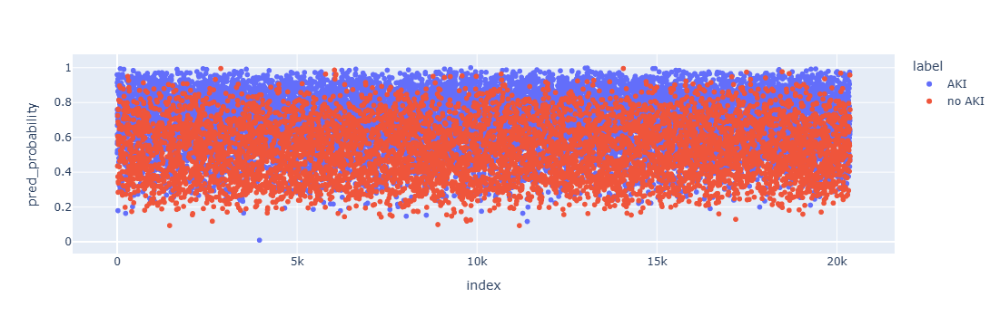

In [64]:
# Use plotly express (px) to visualize test results.
# px expects DataFrame input
pred_df = pd.DataFrame(
    {
        'pred_probability':pred_test.squeeze(),
        'label':label
    }
)
fig = px.scatter(data_frame=pred_df,y='pred_probability',color='label')
fig

In [65]:
weight_el = h_el.weight.detach().squeeze().clone()

#### Compare the weights from LR with no regularization (vanilla), L2, L1, and elastic regularizations

In [66]:
weight_df = pd.DataFrame(
    {
        'none':weight,
        'L2':weight_L2,
        'L1':weight_L1,
        'elastic':weight_el
    }
).melt(id_vars=[],value_vars=['none','L2','L1','elastic'])
weight_df

,variable,value
0,none,0.377626
1,none,0.116046
2,none,0.129982
3,none,-0.128981
4,none,-0.146530
...,...,...
423,elastic,0.243238
424,elastic,0.273967
425,elastic,0.183532
426,elastic,0.055738


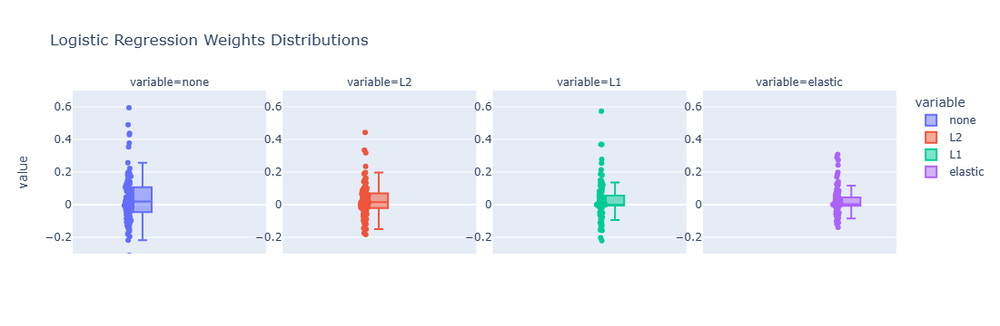

In [72]:
fig = px.box(
    weight_df,
    y='value',
    facet_col='variable',
    color='variable',
    points='all',
    title='Logistic Regression Weights Distributions'
)
fig.update_yaxes(
    matches=None,
    showticklabels=True, range=[-0.3,0.7]
)
fig.update_traces(jitter=0.5)

#### Which weights matter for the elastic regularization?

In [69]:
#Get the feature names
feature_names = list(X_test_norm)

# Get feature importances
weights_el = f_el[0].weight.detach().numpy()
feature_importances = np.abs(weights_el).flatten()
feature_indices = np.argsort(feature_importances)[::-1]

# Print feature importances
for i in feature_indices:
    print(f"Feature: {feature_names[i]}, Importance: {feature_importances[i]:.4f}")

Feature: weight_admit, Importance: 0.3088
Feature: admission_age, Importance: 0.2896
Feature: race_white, Importance: 0.2740
Feature: race_other, Importance: 0.2432
Feature: female, Importance: 0.1982
Feature: race_black, Importance: 0.1835
Feature: temperature_vital_max, Importance: 0.1710
Feature: hematocrit_lab_max, Importance: 0.1398
Feature: gcs_verbal, Importance: 0.1389
Feature: creatinine_min, Importance: 0.1277
Feature: creatinine_max, Importance: 0.1271
Feature: sbp_max, Importance: 0.1247
Feature: hemoglobin_lab_min, Importance: 0.1186
Feature: ptt_max, Importance: 0.1167
Feature: chloride_lab_max, Importance: 0.1090
Feature: sbp_min, Importance: 0.0999
Feature: potassium_lab_max, Importance: 0.0955
Feature: lactate_min, Importance: 0.0935
Feature: bmi, Importance: 0.0850
Feature: bicarbonate_lab_min, Importance: 0.0849
Feature: temperature_vital_min, Importance: 0.0827
Feature: gcs_unable, Importance: 0.0827
Feature: bun_min, Importance: 0.0814
Feature: ph_max, Importance: 

### Feature Selection: Backstep, Forward Step, Genetic Algorithm

In [70]:
from sklearn.linear_model import LogisticRegression as logit # use build-in logistic regression model in sklearn
from sklearn.feature_selection import SequentialFeatureSelector as SFS
from sklearn.metrics import roc_curve, precision_recall_curve

In [76]:
# Use pandas dataset: X_train_norm, X_test_norm, y_train, y_test

#Based on above, choose l2 with strength lambda = 0.01
model = logit(penalty='l2',C=1/100,solver='liblinear') # c: 1/(strength of L1 regularization)

In [77]:
#Based on figure above, start with selecting 10 features
# Forward feature selection.
forward_selection = SFS(
    model, n_features_to_select=10, direction="forward"
).fit(X_train_norm, y_train)

In [78]:
forward_selection.get_feature_names_out()

array(['admission_age', 'heart_rate_max', 'mbp_min', 'baseexcess_min',
       'hematocrit_lab_max', 'hemoglobin_lab_min', 'creatinine_max',
       'ptt_max', 'gcs_verbal', 'weight_admit'], dtype=object)

In [ ]:
# Backward feature selection.
backward_selection = SFS(
    model, n_features_to_select=10, direction="backward"
).fit(X_train_norm, y_train)

In [ ]:
backward_selection.get_feature_names_out()